## Chargement et exploration de données

In [1]:
import pandas as pd
# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
'''Loading data'''
movies= pd.read_csv("movies/movies.csv")

In [3]:
'''Movies information'''
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [4]:
'''Loading data'''
ratings= pd.read_csv("movies/ratings.csv")

In [5]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100836 entries, 0 to 100835
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   userId     100836 non-null  int64  
 1   movieId    100836 non-null  int64  
 2   rating     100836 non-null  float64
 3   timestamp  100836 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 3.1 MB


In [6]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931


In [7]:
print('The count of unique users:', ratings['userId'].nunique())
print('The count of unique movies:', ratings['movieId'].nunique())
print('The unique ratings ', ratings['rating'].unique())

The count of unique users: 610
The count of unique movies: 9724
The unique ratings  [4.  5.  3.  2.  1.  4.5 3.5 2.5 0.5 1.5]


In [8]:
'''Merge movies and rating on movieId'''
data = pd.merge(ratings, movies, on='movieId', how='inner')
data.head()

,userId,movieId,rating,timestamp,title,genres
0,1,1,4.0,964982703,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,5,1,4.0,847434962,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
2,7,1,4.5,1106635946,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
3,15,1,2.5,1510577970,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
4,17,1,4.5,1305696483,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy


In [9]:
# Count NaN values in the merged DataFrame
nan_count = data.isna().sum()

# Display the count of NaN values for each column
print(nan_count)

userId       0
movieId      0
rating       0
timestamp    0
title        0
genres       0
dtype: int64


## Descriptive statistics

In [10]:
aggRating = data.groupby('title').agg(mean_rating = ('rating', 'mean'),number_of_ratings = ('rating', 'count')).reset_index()

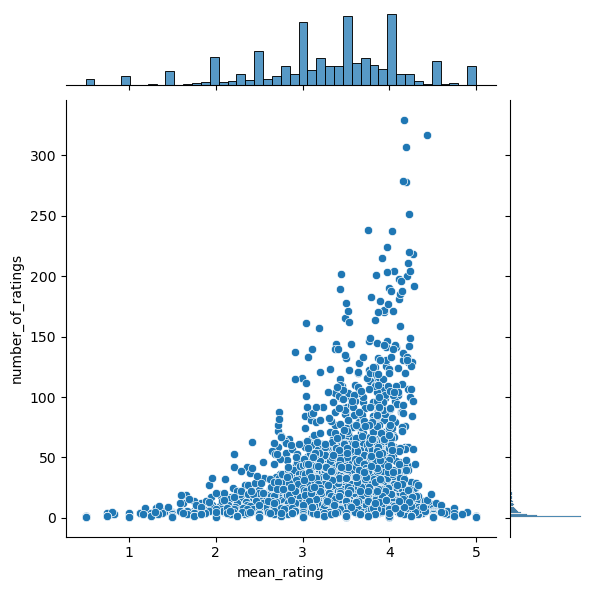

In [11]:
import seaborn as sns

# Visulization
sns.jointplot(x='mean_rating', y='number_of_ratings', data=aggRating)

In [14]:
data = pd.merge(data, aggRating[['title']], on='title', how='inner')


# Feature engineering

In [17]:
# Create user-item matrix
matrix = data.pivot_table(index='userId', columns='title', values='rating')
matrix.info()

<class 'pandas.core.frame.DataFrame'>
Index: 610 entries, 1 to 610
Columns: 9719 entries, '71 (2014) to À nous la liberté (Freedom for Us) (1931)
dtypes: float64(9719)
memory usage: 45.2 MB


In [18]:
matrix.head(10)

title,'71 (2014),'Hellboy': The Seeds of Creation (2004),'Round Midnight (1986),'Salem's Lot (2004),'Til There Was You (1997),'Tis the Season for Love (2015),"'burbs, The (1989)",'night Mother (1986),(500) Days of Summer (2009),*batteries not included (1987),...All the Marbles (1981),...And Justice for All (1979),00 Schneider - Jagd auf Nihil Baxter (1994),1-900 (06) (1994),10 (1979),10 Cent Pistol (2015),10 Cloverfield Lane (2016),10 Items or Less (2006),10 Things I Hate About You (1999),10 Years (2011),"10,000 BC (2008)",100 Girls (2000),100 Streets (2016),101 Dalmatians (1996),101 Dalmatians (One Hundred and One Dalmatians) (1961),101 Dalmatians II: Patch's London Adventure (2003),101 Reykjavik (101 Reykjavík) (2000),102 Dalmatians (2000),10th & Wolf (2006),"10th Kingdom, The (2000)","10th Victim, The (La decima vittima) (1965)","11'09""01 - September 11 (2002)",11:14 (2003),"11th Hour, The (2007)",12 Angry Men (1957),12 Angry Men (1997),12 Chairs (1971),12 Chairs (1976),12 Rounds (2009),12 Years a Slave (2013),127 Hours (2010),13 Assassins (Jûsan-nin no shikaku) (2010),13 Ghosts (1960),13 Going on 30 (2004),13 Hours (2016),13 Sins (2014),13 Tzameti (2005),13th (2016),"13th Warrior, The (1999)",1408 (2007),1492: Conquest of Paradise (1992),15 Minutes (2001),16 Blocks (2006),17 Again (2009),1776 (1972),18 Again! (1988),187 (One Eight Seven) (1997),1900 (Novecento) (1976),1941 (1979),1969 (1988),1984 (Nineteen Eighty-Four) (1984),2 Days in New York (2012),2 Days in Paris (2007),2 Days in the Valley (1996),"2 Fast 2 Furious (Fast and the Furious 2, The) (2003)",2 Guns (2013),20 Dates (1998),20 Feet from Stardom (Twenty Feet from Stardom) (2013),20 Million Miles to Earth (1957),"20,000 Days on Earth (2014)","20,000 Leagues Under the Sea (1916)","20,000 Leagues Under the Sea (1954)",200 Cigarettes (1999),2001 Maniacs (2005),2001: A Space Odyssey (1968),2010: The Year We Make Contact (1984),2012 (2009),2046 (2004),2048: Nowhere to Run (2017),21 (2008),21 Grams (2003),21 Jump Street (2012),21 Up (1977),21 and Over (2013),22 Jump Street (2014),24 Hour Party People (2002),25th Hour (2002),27 Dresses (2008),28 Days (2000),28 Days Later (2002),28 Up (1985),28 Weeks Later (2007),3 Days to Kill (2014),3 Extremes (Three... Extremes) (Saam gaang yi) (2004),3 Idiots (2009),3 Ninjas (1992),3 Ninjas Kick Back (1994),3 Ninjas Knuckle Up (1995),3 Ninjas: High Noon On Mega Mountain (1998),3 Women (Three Women) (1977),3 dev adam (Three Giant Men) (1973),3-Iron (Bin-jip) (2004),30 Days of Night (2007),30 Minutes or Less (2011),300 (2007),3000 Miles to Graceland (2001),300: Rise of an Empire (2014),31 (2016),35 Up (1991),"39 Steps, The (1935)",3:10 to Yuma (1957),3:10 to Yuma (2007),4 Little Girls (1997),"4 Months, 3 Weeks and 2 Days (4 luni, 3 saptamâni si 2 zile) (2007)",40 Days and 40 Nights (2002),"40-Year-Old Virgin, The (2005)","400 Blows, The (Les quatre cents coups) (1959)",42 (2013),42 Up (1998),42nd Street (1933),47 Ronin (2013),48 Hrs. (1982),49 Up (2005),5 Centimeters per Second (Byôsoku 5 senchimêtoru) (2007),5 to 7 (2014),"5,000 Fingers of Dr. T, The (1953)",50 First Dates (2004),50/50 (2011),52 Pick-Up (1986),54 (1998),6 Days to Air: The Making of South Park (2011),61* (2001),"6th Day, The (2000)","6th Man, The (Sixth Man, The) (1997)",7 Days in Hell (2015),7 Faces of Dr. Lao (1964),"7th Voyage of Sinbad, The (1958)",8 1/2 (8½) (1963),8 Heads in a Duffel Bag (1997),8 Mile (2002),8 Seconds (1994),8 Women (2002),8 ½ Women (a.k.a. 8 1/2 Women) (a.k.a. Eight and a Half Women) (1999),800 Bullets (800 Balas) (2002),84 Charing Cross Road (1987),8MM (1999),9 (2009),9 1/2 Weeks (Nine 1/2 Weeks) (1986),9/11 (2002),96 Minutes (2011),964 Pinocchio (1991),99 francs (2007),9to5: Days in Porn (a.k.a. 9 to 5: Days in Porn) (2008),A Bad Moms Christmas (2017),A Christmas Story Live! (2017),A Cosmic Christmas (1977),A Detective Story (2003),A Dog's Purpose (2017),A Flintstones Christmas Carol (1994),A German Life (2016),A Home at the End of the World 

In [20]:
matrix = matrix.subtract(matrix.mean(axis=1), axis = 'rows')
matrix.head()

title,'71 (2014),'Hellboy': The Seeds of Creation (2004),'Round Midnight (1986),'Salem's Lot (2004),'Til There Was You (1997),'Tis the Season for Love (2015),"'burbs, The (1989)",'night Mother (1986),(500) Days of Summer (2009),*batteries not included (1987),...All the Marbles (1981),...And Justice for All (1979),00 Schneider - Jagd auf Nihil Baxter (1994),1-900 (06) (1994),10 (1979),10 Cent Pistol (2015),10 Cloverfield Lane (2016),10 Items or Less (2006),10 Things I Hate About You (1999),10 Years (2011),"10,000 BC (2008)",100 Girls (2000),100 Streets (2016),101 Dalmatians (1996),101 Dalmatians (One Hundred and One Dalmatians) (1961),101 Dalmatians II: Patch's London Adventure (2003),101 Reykjavik (101 Reykjavík) (2000),102 Dalmatians (2000),10th & Wolf (2006),"10th Kingdom, The (2000)","10th Victim, The (La decima vittima) (1965)","11'09""01 - September 11 (2002)",11:14 (2003),"11th Hour, The (2007)",12 Angry Men (1957),12 Angry Men (1997),12 Chairs (1971),12 Chairs (1976),12 Rounds (2009),12 Years a Slave (2013),127 Hours (2010),13 Assassins (Jûsan-nin no shikaku) (2010),13 Ghosts (1960),13 Going on 30 (2004),13 Hours (2016),13 Sins (2014),13 Tzameti (2005),13th (2016),"13th Warrior, The (1999)",1408 (2007),1492: Conquest of Paradise (1992),15 Minutes (2001),16 Blocks (2006),17 Again (2009),1776 (1972),18 Again! (1988),187 (One Eight Seven) (1997),1900 (Novecento) (1976),1941 (1979),1969 (1988),1984 (Nineteen Eighty-Four) (1984),2 Days in New York (2012),2 Days in Paris (2007),2 Days in the Valley (1996),"2 Fast 2 Furious (Fast and the Furious 2, The) (2003)",2 Guns (2013),20 Dates (1998),20 Feet from Stardom (Twenty Feet from Stardom) (2013),20 Million Miles to Earth (1957),"20,000 Days on Earth (2014)","20,000 Leagues Under the Sea (1916)","20,000 Leagues Under the Sea (1954)",200 Cigarettes (1999),2001 Maniacs (2005),2001: A Space Odyssey (1968),2010: The Year We Make Contact (1984),2012 (2009),2046 (2004),2048: Nowhere to Run (2017),21 (2008),21 Grams (2003),21 Jump Street (2012),21 Up (1977),21 and Over (2013),22 Jump Street (2014),24 Hour Party People (2002),25th Hour (2002),27 Dresses (2008),28 Days (2000),28 Days Later (2002),28 Up (1985),28 Weeks Later (2007),3 Days to Kill (2014),3 Extremes (Three... Extremes) (Saam gaang yi) (2004),3 Idiots (2009),3 Ninjas (1992),3 Ninjas Kick Back (1994),3 Ninjas Knuckle Up (1995),3 Ninjas: High Noon On Mega Mountain (1998),3 Women (Three Women) (1977),3 dev adam (Three Giant Men) (1973),3-Iron (Bin-jip) (2004),30 Days of Night (2007),30 Minutes or Less (2011),300 (2007),3000 Miles to Graceland (2001),300: Rise of an Empire (2014),31 (2016),35 Up (1991),"39 Steps, The (1935)",3:10 to Yuma (1957),3:10 to Yuma (2007),4 Little Girls (1997),"4 Months, 3 Weeks and 2 Days (4 luni, 3 saptamâni si 2 zile) (2007)",40 Days and 40 Nights (2002),"40-Year-Old Virgin, The (2005)","400 Blows, The (Les quatre cents coups) (1959)",42 (2013),42 Up (1998),42nd Street (1933),47 Ronin (2013),48 Hrs. (1982),49 Up (2005),5 Centimeters per Second (Byôsoku 5 senchimêtoru) (2007),5 to 7 (2014),"5,000 Fingers of Dr. T, The (1953)",50 First Dates (2004),50/50 (2011),52 Pick-Up (1986),54 (1998),6 Days to Air: The Making of South Park (2011),61* (2001),"6th Day, The (2000)","6th Man, The (Sixth Man, The) (1997)",7 Days in Hell (2015),7 Faces of Dr. Lao (1964),"7th Voyage of Sinbad, The (1958)",8 1/2 (8½) (1963),8 Heads in a Duffel Bag (1997),8 Mile (2002),8 Seconds (1994),8 Women (2002),8 ½ Women (a.k.a. 8 1/2 Women) (a.k.a. Eight and a Half Women) (1999),800 Bullets (800 Balas) (2002),84 Charing Cross Road (1987),8MM (1999),9 (2009),9 1/2 Weeks (Nine 1/2 Weeks) (1986),9/11 (2002),96 Minutes (2011),964 Pinocchio (1991),99 francs (2007),9to5: Days in Porn (a.k.a. 9 to 5: Days in Porn) (2008),A Bad Moms Christmas (2017),A Christmas Story Live! (2017),A Cosmic Christmas (1977),A Detective Story (2003),A Dog's Purpose (2017),A Flintstones Christmas Carol (1994),A German Life (2016),A Home at the End of the World 

In [24]:
similarity = matrix.T.corr()

In [25]:
similarity.head()

userId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610
userId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1.000000,NaN,0.079819,0.207983,0.268749,-0.291636,-0.118773,0.469668,0.918559,-0.037987,-0.087643,NaN,0.878310,0.229081,0.232636,0.191851,0.037901,0.205371,0.325180,0.419641,0.107119,-0.463039,-3.643717e-01,0.249046,-0.166667,0.141421,1.894373e-01,-0.014257,-0.070495,-0.142857,0.033366,0.277017,0.088523,0.032356,0.297044,0.432426,-0.419355,0.246085,-0.225681,-0.354005,-0.134930,0.140809,0.111291,0.684448,0.267402,0.083333,0.502977,-0.102544,0.750000,-0.033596,0.065183,-0.516398,NaN,-0.058222,0.513654,0.260000,0.354260,0.351998,0.075346,NaN,0.156315,0.511682,0.284589,0.201428,0.612372,0.155762,-0.197917,0.028222,0.301511,-0.020870,-0.730487,0.596432,-0.216777,-0.061679,0.454726,0.362147,NaN,0.279620,-0.088798,0.229552,-0.238751,0.103293,0.149626,-0.025999,NaN,0.237428,NaN,0.217643,0.050508,8.215838e-01,0.095662,-1.0,0.194307,-0.303642,0.235706,0.087576,-0.372104,-0.540906,0.58345,0.148877,0.200675,-0.312718,0.037265,0.079559,0.004742,1.0,0.230089,0.051848,-0.053379,1.126229e-01,0.137280,0.583892,0.540833,0.759257,0.265191,0.309

In [26]:
userid = 1

# Remove picked user ID from the candidate list
similarity.drop(index=userid, inplace=True)

# Take a look at the data
similarity.head()

userId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610
userId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,NaN,1.0,NaN,NaN,NaN,NaN,-0.991241,NaN,NaN,0.037796,NaN,NaN,NaN,NaN,-0.330174,-0.176471,0.000000,-0.264646,NaN,NaN,-0.020535,-0.619292,NaN,-0.641689,0.108465,NaN,NaN,-0.166667,-0.310087,NaN,NaN,NaN,1.000000,1.000000,NaN,-1.000000,NaN,NaN,NaN,NaN,0.112792,0.345857,NaN,NaN,0.500000,NaN,0.397187,NaN,0.500000,-0.125770,1.000000,0.260133,NaN,NaN,NaN,-1.000000,-1.000000,NaN,NaN,1.000000,-1.000000,-0.162224,-0.307897,-0.366900,0.121367,0.179029,-0.774597,0.080056,NaN,NaN,NaN,NaN,-0.146703,NaN,NaN,0.237459,0.252248,NaN,NaN,-0.187826,NaN,NaN,0.184289,NaN,NaN,-0.229416,NaN,-0.242536,NaN,NaN,0.693375,NaN,1.000000,NaN,NaN,NaN,NaN,-0.688247,NaN,NaN,NaN,NaN,-0.386749,NaN,-0.264500,NaN,NaN,NaN,NaN,NaN,0.370150,-0.067420,NaN,NaN,NaN,-1.000000,-1.000000,NaN,-0.346124,NaN,NaN,0.207794,-0.511891,NaN,0.191709,NaN,NaN,NaN,NaN,NaN,-0.196116,-0.596040,NaN,NaN,-1.000000,NaN,NaN,NaN,-0.530974,-0.161165,-0.115370,NaN,1.0,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,-0.214043,0.494087,NaN,NaN,-0.654654,NaN,NaN,-0.485428,NaN,NaN,NaN,NaN,NaN,NaN,-0.176777,NaN,NaN,

In [28]:
# Number of similar users
n = 10

# User similarity threashold
similarity_threshold = 0.5

# Get top n similar users
similar_users = similarity[similarity[userid]>similarity_threshold][userid].sort_values(ascending=False)[:n]

# Print out top n similar users
print(f'The similar users for user {userid} are', similar_users)

The similar users for user 1 are userId
598    1.000000
106    1.000000
550    1.000000
333    1.000000
146    1.000000
473    0.962250
511    0.925820
9      0.918559
13     0.878310
366    0.872872
Name: 1, dtype: float64


In [29]:
# Movies that the target user has watched
userid_watched = matrix[matrix.index == userid].dropna(axis=1, how='all')
userid_watched

title,"13th Warrior, The (1999)",20 Dates (1998),"Abyss, The (1989)","Adventures of Robin Hood, The (1938)",Alice in Wonderland (1951),Alien (1979),All Quiet on the Western Front (1930),American Beauty (1999),American History X (1998),"American Tail, An (1986)",Apocalypse Now (1979),Austin Powers: International Man of Mystery (1997),Back to the Future (1985),Back to the Future Part III (1990),Bambi (1942),Basic Instinct (1992),Batman (1989),Batman Returns (1992),Bedknobs and Broomsticks (1971),Beetlejuice (1988),Being John Malkovich (1999),Best Men (1997),Big (1988),"Big Lebowski, The (1998)",Big Trouble in Little China (1986),Billy Madison (1995),"Black Cauldron, The (1985)",Blazing Saddles (1974),Blown Away (1994),"Blues Brothers, The (1980)",Bottle Rocket (1996),Braveheart (1995),Canadian Bacon (1995),Charlotte's Web (1973),Citizen Kane (1941),Clear and Present Danger (1994),Clerks (1994),"Clockwork Orange, A (1971)",Con Air (1997),Conan the Barbarian (1982),Crocodile Dundee (1986),Dances with Wolves (1990),Dazed and Confused (1993),Desperado (1995),Dick Tracy (1990),"Dirty Dozen, The (1967)",Dogma (1999),Dr. No (1962),Dracula (1931),Duck Soup (1933),Dumb & Dumber (Dumb and Dumber) (1994),Dumbo (1941),E.T. the Extra-Terrestrial (1982),Easy Rider (1969),Ed Wood (1994),Edward Scissorhands (1990),Encino Man (1992),Enemy of the State (1998),Escape to Witch Mountain (1975),Excalibur (1981),Face/Off (1997),Fantasia (1940),Fargo (1996),"Few Good Men, A (1992)",Fight Club (1999),Flight of the Navigator (1986),Forrest Gump (1994),Frankenstein (1931),From Dusk Till Dawn (1996),From Russia with Love (1963),"Fugitive, The (1993)",Full Metal Jacket (1987),"Game, The (1997)","Ghost and Mrs. Muir, The (1947)","Ghost and the Darkness, The (1996)",Ghostbusters (a.k.a. Ghost Busters) (1984),Gladiator (2000),Go (1999),Goldfinger (1964),"Good Morning, Vietnam (1987)",Goodfellas (1990),"Goonies, The (1985)","Great Mouse Detective, The (1986)","Green Mile, The (1999)",Grosse Pointe Blank (1997),Groundhog Day (1993),Grumpier Old Men (1995),Grumpy Old Men (1993),Gulliver's Travels (1939),Heat (1995),Henry V (1989),Highlander (1986),"Honey, I Shrunk the Kids (1989)",Hook (1991),Howard the Duck (1986),I Know What You Did Last Summer (1997),I Still Know What You Did Last Summer (1998),Independence Day (a.k.a. ID4) (1996),Indiana Jones and the Last Crusade (1989),Indiana Jones and the Temple of Doom (1984),"Iron Giant, The (1999)",JFK (1991),James and the Giant Peach (1996),"Jungle Book, The (1967)","Jungle Book, The (1994)",Jurassic Park (1993),King Kong (1933),Kiss the Girls (1997),L.A. Confidential (1997),Labyrinth (1986),Ladyhawke (1985),"Last of the Mohicans, The (1992)",Legend (1985),Lethal Weapon (1987),Live and Let Die (1973),"Lock, Stock & Two Smoking Barrels (1998)",Logan's Run (1976),"Longest Day, The (1962)","Lord of the Rings, The (1978)",M*A*S*H (a.k.a. MASH) (1970),Mad Max (1979),"Man with the Golden Gun, The (1974)","Mask, The (1994)","Matrix, The (1999)",McHale's Navy (1997),Men in Black (a.k.a. MIB) (1997),"Messenger: The Story of Joan of Arc, The (1999)",Mission: Impossible (1996),Monty Python and the Holy Grail (1975),Monty Python's Life of Brian (1979),Mr. Smith Goes to Washington (1939),Mrs. Doubtfire (1993),"Mummy, The (1999)","Negotiator, The (1998)","NeverEnding Story, The (1984)","Newton Boys, The (1998)","Nosferatu (Nosferatu, eine Symphonie des Grauens) (1922)",Office Space (1999),Pete's Dragon (1977),Pink Floyd: The Wall (1982),Pinocchio (1940),Planet of the Apes (1968),Platoon (1986),Predator (1987),"Princess Bride, The (1987)",Psycho (1960),Psycho (1998),Pulp Fiction (1994),"Quiet Man, The (1952)",Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981),Red Dawn (1984),"Rescuers, The (1977)",Reservoir Dogs (1992),Return to Oz (1985),Road Trip (2000),"Road Warrior, The (Mad Max 2) (1981)",Rob Roy (1995),Robin Hood (1973),RoboCop (1987),"Rock, The (1996)","Rocketeer, The (1991)",Rocky (1976),"Rocky Ho

In [30]:
user_movies = matrix[matrix.index.isin(similar_users.index)].dropna(axis=1, how='all')
user_movies

title,101 Dalmatians (1996),101 Dalmatians (One Hundred and One Dalmatians) (1961),102 Dalmatians (2000),12 Years a Slave (2013),13 Going on 30 (2004),1408 (2007),"2 Fast 2 Furious (Fast and the Furious 2, The) (2003)",2001: A Space Odyssey (1968),21 (2008),21 Grams (2003),21 Jump Street (2012),28 Days (2000),3-Iron (Bin-jip) (2004),300 (2007),"40-Year-Old Virgin, The (2005)",50 First Dates (2004),8 Mile (2002),Abraham Lincoln: Vampire Hunter (2012),Ace Ventura: Pet Detective (1994),Adaptation (2002),Addams Family Values (1993),"Addams Family, The (1991)",Almost Famous (2000),"Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001)",American History X (1998),Any Given Sunday (1999),Arrival (2016),Austin Powers in Goldmember (2002),Avatar (2009),"Avengers, The (2012)",Avengers: Age of Ultron (2015),Back to the Future (1985),Back to the Future Part II (1989),Back to the Future Part III (1990),Bambi (1942),Batman Begins (2005),Beetlejuice (1988),Big Fish (2003),Big Hero 6 (2014),Big Momma's House (2000),Blind Date (1984),Body of Evidence (1993),"Bodyguard, The (1992)",Borat: Cultural Learnings of America for Make Benefit Glorious Nation of Kazakhstan (2006),Bossa Nova (2000),"Bourne Identity, The (2002)",Braveheart (1995),"Break-Up, The (2006)",Bridge to Terabithia (2007),Buffy the Vampire Slayer (1992),Can't Hardly Wait (1998),Captain America: The First Avenger (2011),Catch Me If You Can (2002),"Cell, The (2000)",Charlie's Angels (2000),Chasing Amy (1997),"Chronicles of Narnia: Prince Caspian, The (2008)","Chronicles of Narnia: The Lion, the Witch and the Wardrobe, The (2005)",Citizen Kane (1941),City Lights (1931),Clash of the Titans (2010),Clerks (1994),Cloud Atlas (2012),Constantine (2005),"Contender, The (2000)","Cook the Thief His Wife & Her Lover, The (1989)","Crouching Tiger, Hidden Dragon (Wo hu cang long) (2000)",Cruel Intentions (1999),"Dark Knight Rises, The (2012)","Dark Knight, The (2008)",Dawn of the Planet of the Apes (2014),Deadpool (2016),Delirium (2014),"Departed, The (2006)",Derailed (2005),"Dictator, The (2012)",Die Another Day (2002),Die Hard (1988),Dinosaur (2000),"Diving Bell and the Butterfly, The (Scaphandre et le papillon, Le) (2007)",Django Unchained (2012),Donnie Darko (2001),Dredd (2012),"Duellists, The (1977)",Easy A (2010),Elling (2001),Elysium (2013),English Vinglish (2012),Eternal Sunshine of the Spotless Mind (2004),Event Horizon (1997),Everything Is Illuminated (2005),Ex Machina (2015),"Fall, The (2006)",Fight Club (1999),Final Destination (2000),"First Wives Club, The (1996)",Flatliners (1990),"Flintstones in Viva Rock Vegas, The (2000)",Forrest Gump (1994),Gangs of New York (2002),Gattaca (1997),"General's Daughter, The (1999)",Ghost Dog: The Way of the Samurai (1999),Gladiator (2000),Glengarry Glen Ross (1992),"Godfather: Part III, The (1990)",Godzilla (1998),Gone in 60 Seconds (2000),Guardians of the Galaxy (2014),Hamlet (1996),Hannibal (2001),Harry Potter and the Chamber of Secrets (2002),Harry Potter and the Deathly Hallows: Part 1 (2010),Harry Potter and the Deathly Hallows: Part 2 (2011),Harry Potter and the Goblet of Fire (2005),Harry Potter and the Half-Blood Prince (2009),Harry Potter and the Order of the Phoenix (2007),Harry Potter and the Prisoner of Azkaban (2004),Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001),"Hobbit: The Desolation of Smaug, The (2013)",Hollow Man (2000),"Host, The (2013)",How the Grinch Stole Christmas (a.k.a. The Grinch) (2000),Hugo (2011),Hulk (2003),I Spit on Your Grave (Day of the Woman) (1978),I Still Know What You Did Last Summer (1998),Ice Age (2002),"Illusionist, The (2006)","In Crowd, The (2000)",Inception (2010),"Incredibles, The (2004)","Indian in the Cupboard, The (1995)",Inglourious Basterds (2009),Insurgent (2015),Interstellar (2014),Intouchables (2011),Iron Man & Hulk: Heroes United (2013),Iron Man (1931),Iron Man (2008),Iron Man 2 (2010),Iron Man 3 (2013),"Island of Dr. Moreau, The (1996)",Jack (1996)

In [31]:
# Remove the watched movie from the movie list
user_movies.drop(userid_watched.columns,axis=1, inplace=True, errors='ignore')

user_movies

title,101 Dalmatians (1996),101 Dalmatians (One Hundred and One Dalmatians) (1961),102 Dalmatians (2000),12 Years a Slave (2013),13 Going on 30 (2004),1408 (2007),"2 Fast 2 Furious (Fast and the Furious 2, The) (2003)",2001: A Space Odyssey (1968),21 (2008),21 Grams (2003),21 Jump Street (2012),28 Days (2000),3-Iron (Bin-jip) (2004),300 (2007),"40-Year-Old Virgin, The (2005)",50 First Dates (2004),8 Mile (2002),Abraham Lincoln: Vampire Hunter (2012),Ace Ventura: Pet Detective (1994),Adaptation (2002),Addams Family Values (1993),"Addams Family, The (1991)",Almost Famous (2000),"Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001)",Any Given Sunday (1999),Arrival (2016),Austin Powers in Goldmember (2002),Avatar (2009),"Avengers, The (2012)",Avengers: Age of Ultron (2015),Back to the Future Part II (1989),Batman Begins (2005),Big Fish (2003),Big Hero 6 (2014),Big Momma's House (2000),Blind Date (1984),Body of Evidence (1993),"Bodyguard, The (1992)",Borat: Cultural Learnings of America for Make Benefit Glorious Nation of Kazakhstan (2006),Bossa Nova (2000),"Bourne Identity, The (2002)","Break-Up, The (2006)",Bridge to Terabithia (2007),Buffy the Vampire Slayer (1992),Can't Hardly Wait (1998),Captain America: The First Avenger (2011),Catch Me If You Can (2002),"Cell, The (2000)",Charlie's Angels (2000),Chasing Amy (1997),"Chronicles of Narnia: Prince Caspian, The (2008)","Chronicles of Narnia: The Lion, the Witch and the Wardrobe, The (2005)",City Lights (1931),Clash of the Titans (2010),Cloud Atlas (2012),Constantine (2005),"Contender, The (2000)","Cook the Thief His Wife & Her Lover, The (1989)","Crouching Tiger, Hidden Dragon (Wo hu cang long) (2000)",Cruel Intentions (1999),"Dark Knight Rises, The (2012)","Dark Knight, The (2008)",Dawn of the Planet of the Apes (2014),Deadpool (2016),Delirium (2014),"Departed, The (2006)",Derailed (2005),"Dictator, The (2012)",Die Another Day (2002),Die Hard (1988),Dinosaur (2000),"Diving Bell and the Butterfly, The (Scaphandre et le papillon, Le) (2007)",Django Unchained (2012),Donnie Darko (2001),Dredd (2012),"Duellists, The (1977)",Easy A (2010),Elling (2001),Elysium (2013),English Vinglish (2012),Eternal Sunshine of the Spotless Mind (2004),Event Horizon (1997),Everything Is Illuminated (2005),Ex Machina (2015),"Fall, The (2006)",Final Destination (2000),"First Wives Club, The (1996)",Flatliners (1990),"Flintstones in Viva Rock Vegas, The (2000)",Gangs of New York (2002),Gattaca (1997),"General's Daughter, The (1999)",Ghost Dog: The Way of the Samurai (1999),Glengarry Glen Ross (1992),"Godfather: Part III, The (1990)",Godzilla (1998),Gone in 60 Seconds (2000),Guardians of the Galaxy (2014),Hamlet (1996),Hannibal (2001),Harry Potter and the Chamber of Secrets (2002),Harry Potter and the Deathly Hallows: Part 1 (2010),Harry Potter and the Deathly Hallows: Part 2 (2011),Harry Potter and the Goblet of Fire (2005),Harry Potter and the Half-Blood Prince (2009),Harry Potter and the Order of the Phoenix (2007),Harry Potter and the Prisoner of Azkaban (2004),Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001),"Hobbit: The Desolation of Smaug, The (2013)",Hollow Man (2000),"Host, The (2013)",How the Grinch Stole Christmas (a.k.a. The Grinch) (2000),Hugo (2011),Hulk (2003),I Spit on Your Grave (Day of the Woman) (1978),Ice Age (2002),"Illusionist, The (2006)","In Crowd, The (2000)",Inception (2010),"Incredibles, The (2004)","Indian in the Cupboard, The (1995)",Inglourious Basterds (2009),Insurgent (2015),Interstellar (2014),Intouchables (2011),Iron Man & Hulk: Heroes United (2013),Iron Man (1931),Iron Man (2008),Iron Man 2 (2010),Iron Man 3 (2013),"Island of Dr. Moreau, The (1996)",Jack (1996),Jackass Number Two (2006),Jackass: The Movie (2002),John Wick (2014),Juno (2007),"Kid, The (2000)",Kill Bill: Vol. 1 (2003),Kill Bill: Vol. 2 (2004),King Kong (2005),"King of Comedy, The (1983)",Kingsman: The Secret Service (2015),Kung Fu Panda (2008),Laggies (2014),"La

In [32]:
# A dictionary to store item scores
item_score = {}

# Loop through items
for i in user_movies.columns:
  # Get the ratings for movie i
  movie_rating = user_movies[i]
  # Create a variable to store the score
  total = 0
  # Create a variable to store the number of scores
  count = 0
  # Loop through similar users
  for u in similar_users.index:
    # If the movie has rating
    if pd.isna(movie_rating[u]) == False:
      # Score is the sum of user similarity score multiply by the movie rating
      score = similar_users[u] * movie_rating[u]
      # Add the score to the total score for the movie so far
      total += score
      # Add 1 to the count
      count +=1
  # Get the average score for the item
  item_score[i] = total / count

# Convert dictionary to pandas dataframe
item_score = pd.DataFrame(item_score.items(), columns=['movie', 'movie_score'])
    
# Sort the movies by score
ranked_item_score = item_score.sort_values(by='movie_score', ascending=False)

# Select top m movies
m = 10
ranked_item_score.head(m)

,movie,movie_score
39,Bossa Nova (2000),2.360000
179,One Flew Over the Cuckoo's Nest (1975),2.360000
246,Twelve Monkeys (a.k.a. 12 Monkeys) (1995),1.859375
12,3-Iron (Bin-jip) (2004),1.859375
19,Adaptation (2002),1.597493
157,Loser (2000),1.360000
159,Love's Labour's Lost (2000),1.360000
15,50 First Dates (2004),1.359375
80,Eternal Sunshine of the Spotless Mind (2004),1.355936
110,"Host, The (2013)",1.190476
